In [10]:
import numpy as np
import librosa as lr
import os
import muda
import json
import scipy
import matplotlib.pyplot as plt

from IPython.display import Audio 


import sys
sys.path.append('..')
from utils import *

In [11]:
BASE_LOC = "/beegfs/ci411/pcen/"
DATA_LOC = BASE_LOC + "URBAN-SED_v2.0.0/"

TRAIN_AUDIO_LOC = DATA_LOC + "audio/train/"
TRAIN_ANNOTATIONS_LOC = DATA_LOC + "annotations/train/"
TRAIN_FEATURES_LOC = DATA_LOC + "features/train/"

VALIDATE_AUDIO_LOC = DATA_LOC + "audio/validate/"
VALIDATE_ANNOTATIONS_LOC = DATA_LOC + "annotations/validate/"
VALIDATE_FEATURES_LOC = DATA_LOC + "features/validate/"

TEST_AUDIO_LOC = DATA_LOC + "audio/test/"
TEST_ANNOTATIONS_LOC = DATA_LOC + "annotations/test/"
TEST_FEATURES_LOC = DATA_LOC + "features/test/"


MODEL_LOC = BASE_LOC +"models/"

URBANSED_CLASSES = ['air_conditioner',
                    'car_horn',
                    'children_playing',
                    'dog_bark',
                    'drilling',
                    'engine_idling',
                    'gun_shot',
                    'jackhammer',
                    'siren',
                    'street_music']

DEMO_ID = "bimodal761"

DEMO_AUDIO_LOC = "/beegfs/ci411/pcen/URBAN-SED_v2.0.0/audio/train/soundscape_train_{}.wav".format(DEMO_ID)
DEMO_ANNOTATION_LOC = "/beegfs/ci411/pcen/URBAN-SED_v2.0.0/annotations/train/soundscape_train_{}.jams".format(DEMO_ID)

x_t, sr = lr.load(DEMO_AUDIO_LOC)
Audio(data=x_t, rate=sr)
hop_length = 512
n_fft = 1024
n_mels = 128
n_t_constants = 10

In [12]:
from muda.deformers import IRConvolution

IR_LOC = "/beegfs/ci411/pcen/ir"
IR_FILES = os.listdir(IR_LOC)
IR_LOCS = [os.path.join(IR_LOC, file) for file in IR_FILES]

In [13]:
print(IR_LOCS[0])
Audio(IR_LOCS[0])

/beegfs/ci411/pcen/ir/tunnel.wav


In [14]:
print(IR_LOCS[1])
Audio(IR_LOCS[1])

/beegfs/ci411/pcen/ir/sim_long.wav


In [15]:
print(IR_LOCS[2])
Audio(IR_LOCS[2])

/beegfs/ci411/pcen/ir/alley.wav


In [16]:
from muda.base import BaseTransformer, Pipeline

class Normalize(BaseTransformer):
    def audio(self, mudabox, state):
        # Normalize the data
        mudabox._audio['y'] = lr.util.normalize(mudabox._audio['y'])
        
    def states(self, jam):
        for _ in range(1):
            yield _

In [17]:
class IRConvolution_normalized(IRConvolution):
    def audio(self, mudabox, state):
        # Deform the audio
        fname = state["filename"]

        y_ir, sr_ir = lr.load(fname, sr=mudabox._audio["sr"])

        mudabox._audio["y"] = scipy.signal.convolve(
            mudabox._audio["y"], y_ir, mode="full"
        )
        mudabox._audio['y'] = lr.util.normalize(mudabox._audio['y'])


In [19]:
orig_audio = muda.load_jam_audio(DEMO_ANNOTATION_LOC, DEMO_AUDIO_LOC)
ir_deformer = IRConvolution_normalized(IR_LOCS)

transformed = list(ir_deformer.transform(orig_audio))

In [20]:
Audio(DEMO_AUDIO_LOC)

In [21]:
Audio(data=transformed[0].sandbox.muda._audio['y'], rate=transformed[0].sandbox.muda._audio['sr'])

In [22]:
Audio(data=transformed[1].sandbox.muda._audio['y'], rate=transformed[1].sandbox.muda._audio['sr'])

In [23]:
Audio(data=transformed[2].sandbox.muda._audio['y'], rate=transformed[2].sandbox.muda._audio['sr'])

In [63]:
TEST_OUT = "/beegfs/ci411/pcen/reverb_URBAN-SED/testing"

In [ ]:
for i, jam_out in enumerate(ir_deformer.transform(orig_audio)):
    muda.save(os.path.join(TEST_OUT, 'audio', 'test{}.wav'.format(i)),
              os.path.join(TEST_OUT, 'annotations','test{}.jams'.format(i)),
              jam_out)

In [31]:
Audio("/beegfs/ci411/pcen/reverb_URBAN-SED/testing/audio/test0.wav")

In [33]:
Audio("/beegfs/ci411/pcen/reverb_URBAN-SED/testing/audio/test1.wav")

In [34]:
Audio("/beegfs/ci411/pcen/reverb_URBAN-SED/testing/audio/test2.wav")

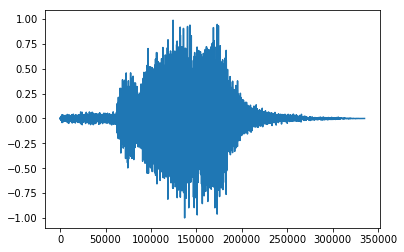

In [35]:
y_load,_ = lr.load("/beegfs/ci411/pcen/reverb_URBAN-SED/testing/audio/test0.wav")
plt.plot(np.arange(len(y_load)), y_load)
plt.show()
Audio("/beegfs/ci411/pcen/reverb_URBAN-SED/testing/audio/test0.wav")

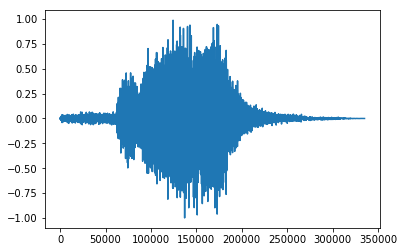

In [36]:
y_init = transformed[0].sandbox.muda._audio['y']
plt.plot(np.arange(len(y_init)), y_init)
plt.show()
Audio(data=transformed[0].sandbox.muda._audio['y'], rate=transformed[0].sandbox.muda._audio['sr'])

In [37]:
t_5s = np.arange(5*sr)
white_noise_5s = np.random.normal(size=len(t_5s))

In [38]:
Audio(data=white_noise_5s, rate=sr)

In [39]:
IR_SIM_LOC = "/beegfs/ci411/pcen/ir"

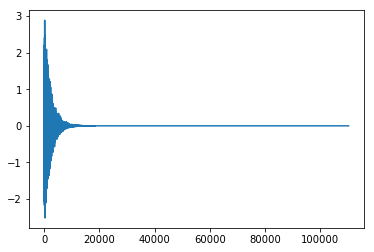

/beegfs/ci411/pcen/ir/sim_short.wav


In [40]:
short_decay_5s = np.exp(-1*t_5s/(0.1*sr))
short_ir = white_noise_5s * short_decay_5s
plt.plot(t_5s, short_ir)
plt.show()
short_path = os.path.join(IR_SIM_LOC,'sim_short.wav')
print(short_path)
lr.output.write_wav(short_path, short_ir, sr)
Audio(data=short_ir, rate=sr)

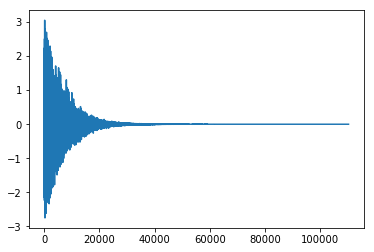

/beegfs/ci411/pcen/ir/sim_medium.wav


In [41]:
medium_decay_5s = np.exp(-1*t_5s/(0.3*sr))
medium_ir = white_noise_5s * medium_decay_5s
plt.plot(t_5s, medium_ir)
plt.show()
medium_path = os.path.join(IR_SIM_LOC,'sim_medium.wav')
print(medium_path)
lr.output.write_wav(medium_path, medium_ir, sr)
Audio(data=medium_ir, rate=sr)

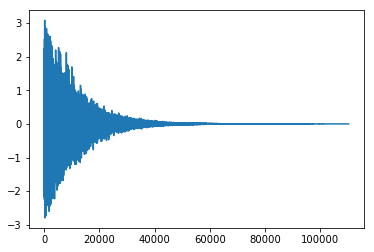

/beegfs/ci411/pcen/ir/sim_long.wav


In [42]:
long_decay_5s = np.exp(-1*t_5s/(0.5*sr))
long_ir = white_noise_5s * long_decay_5s
plt.plot(t_5s, long_ir)
plt.show()
long_path = os.path.join(IR_SIM_LOC,'sim_long.wav')
print(long_path)
lr.output.write_wav(long_path, long_ir, sr)
Audio(data=long_ir, rate=sr)

In [44]:
IR_SIM_FILES = os.listdir(IR_SIM_LOC)
IR_SIM_LOCS = [os.path.join(IR_SIM_LOC, file) for file in IR_SIM_FILES]
print(IR_SIM_LOCS)

['/beegfs/ci411/pcen/ir/tunnel.wav', '/beegfs/ci411/pcen/ir/sim_long.wav', '/beegfs/ci411/pcen/ir/alley.wav', '/beegfs/ci411/pcen/ir/sim_medium.wav', '/beegfs/ci411/pcen/ir/bedroom.wav', '/beegfs/ci411/pcen/ir/sim_short.wav']


In [45]:
ir_sim_deformer = IRConvolution_normalized(IR_SIM_LOCS)

transformed_sim = list(ir_sim_deformer.transform(orig_audio))

In [46]:
Audio(DEMO_AUDIO_LOC)

In [47]:
Audio(data=transformed_sim[0].sandbox.muda._audio['y'], rate=transformed[0].sandbox.muda._audio['sr'])

In [48]:
Audio(data=transformed_sim[1].sandbox.muda._audio['y'], rate=transformed[0].sandbox.muda._audio['sr'])

In [49]:
Audio(data=transformed_sim[2].sandbox.muda._audio['y'], rate=transformed[0].sandbox.muda._audio['sr'])

In [50]:
Audio(DEMO_AUDIO_LOC)

In [51]:
IR_LOCS

['/beegfs/ci411/pcen/ir/tunnel.wav',
 '/beegfs/ci411/pcen/ir/sim_long.wav',
 '/beegfs/ci411/pcen/ir/alley.wav',
 '/beegfs/ci411/pcen/ir/sim_medium.wav',
 '/beegfs/ci411/pcen/ir/bedroom.wav',
 '/beegfs/ci411/pcen/ir/sim_short.wav']

In [52]:
IR_SIM_LOCS[::-1]

['/beegfs/ci411/pcen/ir/sim_short.wav',
 '/beegfs/ci411/pcen/ir/bedroom.wav',
 '/beegfs/ci411/pcen/ir/sim_medium.wav',
 '/beegfs/ci411/pcen/ir/alley.wav',
 '/beegfs/ci411/pcen/ir/sim_long.wav',
 '/beegfs/ci411/pcen/ir/tunnel.wav']

In [60]:
IR_DIR = '/beegfs/ci411/pcen/ir/'
ALL_IR_LOCS=[os.path.join(IR_DIR, file) for file in os.listdir('/beegfs/ci411/pcen/ir/')]
                            
print(ALL_IR_LOCS)

out_dict = {0:'bedroom_', 1:'alley_', 2:'tunnel_', 3:'sim-short_', 4:'sim-med_', 5:'sim-long_'}

['/beegfs/ci411/pcen/ir/tunnel.wav', '/beegfs/ci411/pcen/ir/sim_long.wav', '/beegfs/ci411/pcen/ir/alley.wav', '/beegfs/ci411/pcen/ir/sim_medium.wav', '/beegfs/ci411/pcen/ir/bedroom.wav', '/beegfs/ci411/pcen/ir/sim_short.wav']


In [64]:
orig_audio = muda.load_jam_audio(DEMO_ANNOTATION_LOC, DEMO_AUDIO_LOC)
full_ir_deformer = IRConvolution_normalized(ALL_IR_LOCS)

for i, jam_out in enumerate(full_ir_deformer.transform(orig_audio)):
    
    muda.save(os.path.join(TEST_OUT, 'audio', out_dict[i%6] + 'test.wav'),
              os.path.join(TEST_OUT, 'annotations',out_dict[i%6] + 'test.jams'),
              jam_out)

In [65]:
from joblib import Parallel, delayed

def base(filename):
    '''Identify a file by its basename:
    /path/to/base.name.ext => base.name
    Parameters
    ----------
    filename : str
        Path to the file
    Returns
    -------
    base : str
        The base name of the file
    '''
    return os.path.splitext(os.path.basename(filename))[0]

def get_ann_audio(aud_loc, ann_loc): 
    '''Get a list of annotations and audio files from a pair of directories.
    This also validates that the lengths match and are paired properly.
    Parameters
    ----------
    directory : str
        The directory to search
    Returns
    -------
    pairs : list of tuples (audio_file, annotation_file)
    '''

    audio = find_files(aud_loc)
    annos = find_files(ann_loc, ext=['jams', 'jamz'])

    paired = list(zip(audio, annos))

    if (len(audio) != len(annos) or
       any([base(aud) != base(ann) for aud, ann in paired])):
        raise RuntimeError('Unmatched audio/annotation '
                           'data in {}'.format(directory))

    return paired

train_pairs= get_ann_audio(TRAIN_AUDIO_LOC, TRAIN_ANNOTATIONS_LOC)
validate_pairs= get_ann_audio(VALIDATE_AUDIO_LOC, VALIDATE_ANNOTATIONS_LOC)
test_pairs= get_ann_audio(TEST_AUDIO_LOC, TEST_ANNOTATIONS_LOC)

In [66]:
def deform_audio(aud, ann, deformer, aud_out, ann_out):
    
    orig_audio = muda.load_jam_audio(ann, aud)
    filename = base(aud)
    for i, jam_out in enumerate(deformer.transform(orig_audio)):
        muda.save(os.path.join(aud_out, out_dict[i%6] + filename + '.wav'),
                  os.path.join(ann_out, out_dict[i%6] + filename + '.jams'),
                  jam_out)

In [67]:
deform_audio(DEMO_AUDIO_LOC, DEMO_ANNOTATION_LOC, full_ir_deformer,\
             os.path.join(TEST_OUT,'audio'), os.path.join(TEST_OUT,'annotations'))

In [68]:
AUD_TRAIN_OUT = "/beegfs/ci411/pcen/URBAN-SED_v2.0.0_REVERB/audio/train"
ANN_TRAIN_OUT = "/beegfs/ci411/pcen/URBAN-SED_v2.0.0_REVERB/annotations/train"
#Parallel(n_jobs=4)(delayed(deform_audio)(aud, ann, full_ir_deformer, AUD_TRAIN_OUT, ANN_TRAIN_OUT)\
                           #for aud, ann in train_pairs)


AUD_VALIDATE_OUT = "/beegfs/ci411/pcen/URBAN-SED_v2.0.0_REVERB/audio/validate"
ANN_VALIDATE_OUT = "/beegfs/ci411/pcen/URBAN-SED_v2.0.0_REVERB/annotations/validate"
#Parallel(n_jobs=4)(delayed(deform_audio)(aud, ann, full_ir_deformer, AUD_VALIDATE_OUT, ANN_VALIDATE_OUT)\
                           #for aud, ann in validate_pairs)


AUD_TEST_OUT = "/beegfs/ci411/pcen/URBAN-SED_v2.0.0_REVERB/audio/test"
ANN_TEST_OUT = "/beegfs/ci411/pcen/URBAN-SED_v2.0.0_REVERB/annotations/test"
#Parallel(n_jobs=4)(delayed(deform_audio)(aud, ann, full_ir_deformer, AUD_TEST_OUT, ANN_TEST_OUT)\
                           #for aud, ann in test_pairs)


IndentationError: unexpected indent (<ipython-input-68-c8bab38f3cf7>, line 4)

In [79]:
print('foo'.join(['bar']))

bfooafoor


In [87]:
!python /home/ci411/pcen-t-varying/scripts/00_augment.py --output-dir '/beegfs/ci411/pcen/reverb_URBAN-SED_test'

TORYA0
/beegfs/ci411/pcen/reverb_URBAN-SED_2/audio/train/soundscape_train_bimodal100_tunnel.wav
/beegfs/ci411/pcen/reverb_URBAN-SED_2/annotations/train/soundscape_train_bimodal100_tunnel.jams
TORYA0
/beegfs/ci411/pcen/reverb_URBAN-SED_2/audio/train/soundscape_train_bimodal1_tunnel.wav
/beegfs/ci411/pcen/reverb_URBAN-SED_2/annotations/train/soundscape_train_bimodal1_tunnel.jams
TORYA0
/beegfs/ci411/pcen/reverb_URBAN-SED_2/audio/train/soundscape_train_bimodal10_tunnel.wav
/beegfs/ci411/pcen/reverb_URBAN-SED_2/annotations/train/soundscape_train_bimodal10_tunnel.jams
TORYA0
/beegfs/ci411/pcen/reverb_URBAN-SED_2/audio/train/soundscape_train_bimodal0_tunnel.wav
/beegfs/ci411/pcen/reverb_URBAN-SED_2/annotations/train/soundscape_train_bimodal0_tunnel.jams
TORYA1
/beegfs/ci411/pcen/reverb_URBAN-SED_2/audio/train/soundscape_train_bimodal100_sim_long.wav
/beegfs/ci411/pcen/reverb_URBAN-SED_2/annotations/train/soundscape_train_bimodal100_sim_long.jams
TORYA1
/beegfs/ci411/pcen/reverb_URBAN-SED_2/a